In [1]:
cd /g/data/jk72/deg581/apom/ana/notebooks

/g/data/jk72/deg581/apom/ana/notebooks


In [2]:
%%time
# load modules
## Data processing and DA modules
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
import matplotlib.ticker as mticker

## Dealing with big data and netcdf
import xarray as xr
from netCDF4 import Dataset
## ROMS packages
from xgcm import Grid
## color maps
import cmaps
import cmocean
## mapping packages
import cartopy.crs as ccrs
import cartopy.feature as cfeature
## System tools and python configuration
import os
import glob
# import repackage
# repackage.add('../../')
# repackage.add('../')

from scipy.ndimage import gaussian_filter1d


CPU times: user 9.48 s, sys: 2.94 s, total: 12.4 s
Wall time: 24.3 s


In [3]:
# from dask.distributed import Client

In [4]:
# client = Client()
# client

## define functions

In [5]:

def inpolygon(xq, yq, xv, yv):
    from matplotlib import path
    shape = xq.shape
    xq = xq.reshape(-1)
    yq = yq.reshape(-1)
    xv = xv.reshape(-1)
    yv = yv.reshape(-1)
    q = [(xq[i], yq[i]) for i in range(xq.shape[0])]
    p = path.Path([(xv[i], yv[i]) for i in range(xv.shape[0])])
    return p.contains_points(q).reshape(shape)

# map u,v to rho points
def ROMSmetricsAndGrid(ds):
    ds = ds_CTRL.rename({'eta_u': 'eta_rho', 'xi_v': 'xi_rho', 'xi_psi': 'xi_u', 'eta_psi': 'eta_v'})

    coords={'X':{'center':'xi_rho', 'inner':'xi_u'}, 
        'Y':{'center':'eta_rho', 'inner':'eta_v'}, 
        'Z':{'center':'s_rho', 'outer':'s_w'}}

    grid = Grid(ds, coords=coords, periodic=[])

    print('making pm/pn metrics')
    ds['pm_v'] = grid.interp(ds_CTRL.pm, 'Y')
    ds['pn_u'] = grid.interp(ds_CTRL.pn, 'X')
    ds['pm_u'] = grid.interp(ds_CTRL.pm, 'X')
    ds['pn_v'] = grid.interp(ds_CTRL.pn, 'Y')
    ds['pm_psi'] = grid.interp(grid.interp(ds_CTRL.pm, 'Y'),  'X') # at psi points (eta_v, xi_u) 
    ds['pn_psi'] = grid.interp(grid.interp(ds_CTRL.pn, 'X'),  'Y') # at psi points (eta_v, xi_u)
    print('making dx/dy')
    ds['dx'] = 1/ds_CTRL.pm
    ds['dx_u'] = 1/ds_CTRL.pm_u
    ds['dx_v'] = 1/ds_CTRL.pm_v
    ds['dx_psi'] = 1/ds_CTRL.pm_psi

    ds['dy'] = 1/ds_CTRL.pn
    ds['dy_u'] = 1/ds_CTRL.pn_u
    ds['dy_v'] = 1/ds_CTRL.pn_v
    ds['dy_psi'] = 1/ds_CTRL.pn_psi

#     ds['dz'] = grid.diff(ds_CTRL.z_w, 'Z', boundary='fill')
#     ds['dz_w'] = grid.diff(ds_CTRL.z_rho, 'Z', boundary='fill')
#     ds['dz_u'] = grid.interp(ds_CTRL.dz, 'X')
#     ds['dz_w_u'] = grid.interp(ds_CTRL.dz_w, 'X')
#     ds['dz_v'] = grid.interp(ds_CTRL.dz, 'Y')
#     ds['dz_w_v'] = grid.interp(ds_CTRL.dz_w, 'Y')

    ds['dA'] = ds_CTRL.dx * ds_CTRL.dy

    metrics = {
        ('X',): ['dx', 'dx_u', 'dx_v', 'dx_psi'], # X distances
        ('Y',): ['dy', 'dy_u', 'dy_v', 'dy_psi'], # Y distances
        # ('Z',): ['dz', 'dz_u', 'dz_v', 'dz_w', 'dz_w_u', 'dz_w_v'], # Z distances
        ('X', 'Y'): ['dA'] # Areas
    }
    grid = Grid(ds, coords=coords, metrics=metrics, periodic=[])

    return ds,grid



def add_zeros_to_4(date):
    if date<10:
        to_add = '000'
    elif date>9 & date<100:
        to_add = '00'
    elif date>99 & date < 1000:
        to_add = '0'
    else: 
        to_add = ''
    return to_add

def generateFileList(FilePath,prefix,datelist):
    filelist=[FilePath+prefix+add_zeros_to_4(datelist[0])+str(datelist[0])+'.nc']
    for dates in datelist[1:]:
        filenameToAppend=FilePath+prefix+add_zeros_to_4(dates)+str(dates)+'.nc'
        filelist.append(filenameToAppend)
    return filelist

## load data sets


In [6]:
grd = xr.open_dataset('/g/data/jk72/deg581/apom/frc/amery_v2km_v13_grd.nc')


In [7]:


FilePath='/g/data/gv90/bkg581/prd_amery/amery_CTRL/' # Truth file settings
prefix='roms_avg_'
timeRange = [49, 54]
datelist = np.array(range(timeRange[0],timeRange[1],1))


fl=generateFileList(FilePath,prefix,datelist)
print(fl)

# ds=loadOverlappedNetcdfFileList(filelist=fl,overlapDays=7)

ds = xr.open_mfdataset(fl,chunks = {'ocean_time':1}, data_vars='minimal', compat='override',coords='minimal',parallel='False',join='right')

print(ds_CTRL.nbytes/1e9,'G')

ds = ds_CTRL.drop_vars(['sustr','svstr','ssflux','shflux','AKt','AKv','Hsbl','w','ubar','vbar'])
ds['my'] = ds_CTRL.m*(60*60*24*365)
print(ds_CTRL.nbytes/1e9,'G')
ds

ds = ds_CTRL.assign_coords({"x_rho": grd.x_rho})
ds = ds_CTRL.assign_coords({"y_rho": grd.y_rho})
ds = ds_CTRL.assign_coords({"lon_rho": grd.lon_rho})
ds = ds_CTRL.assign_coords({"lat_rho": grd.lat_rho})

# ds['hc'] = grd.hc
# ds['s_w']=grd.s_w
# ds['s_rho']=grd.s_rho
# ds['Cs_w']=grd.Cs_w
# ds['Cs_r']=grd.Cs_r


# ds_raw = ds_raw.assign_coords(lon_rho=grd.lon_rho)
# ds_raw = ds_raw.assign_coords(lat_rho=grd.lat_rho)

ds['mask_zice'] = (ds_CTRL.mask_rho.where(ds_CTRL.zice<0)==1) # make a logic mask for ice

ds['mask_openocean'] = ds_CTRL.mask_rho*(ds_CTRL.mask_zice==0)

ds['mask_openoceanNaN'] = ds_CTRL.mask_openocean.where(ds_CTRL.mask_openocean)

ds['mask_rhoNaN'] = ds_CTRL.mask_rho.where(ds_CTRL.mask_rho)

ds['mask_ziceNaN'] = ds_CTRL.mask_zice.where(ds_CTRL.mask_zice)

# make masks

poly_shelf = np.array([
    [1.55e6,600000],
    [2.25e6,600000],
    [2.25e6,800000],
    [2.20e6,830000],
    [1.55e6,890000]])
# plt.plot(poly_shelf[:,0],poly_shelf[:,1])
# plt.show()



mask_roi = inpolygon(ds_CTRL.x_rho.values, ds_CTRL.y_rho.values,poly_shelf[:,0], poly_shelf[:,1])


ds['mask_zice_roi'] = ds_CTRL.mask_zice*mask_roi
# ds_CTRL.mask_zice_roi.plot()
roi_label1 = 'amery'
ds_CTRL.mask_zice_roi.attrs['long_name']=roi_label1

# set any grid data here.

weights_area = (1/ds_CTRL.pm)*(1/ds_CTRL.pn)
weights_area.name = "weights"

print('making vertical coordinates')
Zo_rho = (ds_CTRL.hc * ds_CTRL.s_rho + ds_CTRL.Cs_r * ds_CTRL.h) / (ds_CTRL.hc + ds_CTRL.h)
z_rho = (ds_CTRL.zice) + ((ds_CTRL.zice) + ds_CTRL.h) * Zo_rho
Zo_w = (ds_CTRL.hc * ds_CTRL.s_w + ds_CTRL.Cs_w * ds_CTRL.h) / (ds_CTRL.hc + ds_CTRL.h)
z_w = Zo_w * ((ds_CTRL.zice) + ds_CTRL.h) + (ds_CTRL.zice)
    
ds_CTRL.coords['z_w0'] = z_w.where(ds_CTRL.mask_rho, 0).transpose('s_w', 'eta_rho', 'xi_rho')
ds_CTRL.coords['z_rho0'] = z_rho.where(ds_CTRL.mask_rho, 0).transpose('s_rho', 'eta_rho', 'xi_rho')

ds['dz'] = (('s_rho', 'eta_rho', 'xi_rho'),np.diff(ds_CTRL.z_w0,axis=0))


ds, grid = ROMSmetricsAndGrid(ds)

print('mapping u/v to u/v rho')
ds['u_rho'] = grid.interp(ds_CTRL.u,'X')
ds['v_rho'] = grid.interp(ds_CTRL.v,'Y')

ds_CTRL = ds

ds_CTRL.close()

['/g/data/gv90/bkg581/prd_amery/amery_CTRL/roms_avg_0049.nc', '/g/data/gv90/bkg581/prd_amery/amery_CTRL/roms_avg_0050.nc', '/g/data/gv90/bkg581/prd_amery/amery_CTRL/roms_avg_0051.nc', '/g/data/gv90/bkg581/prd_amery/amery_CTRL/roms_avg_0052.nc', '/g/data/gv90/bkg581/prd_amery/amery_CTRL/roms_avg_0053.nc']
259.204128416 G
159.673446416 G
making vertical coordinates
making pm/pn metrics
making dx/dy
mapping u/v to u/v rho


/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return

In [8]:
print(' make dayofyear means ')
print(' have to first fix the time coordinate to ignore the leap year. sigh.')

No_of_years=5
dayofyear = np.concatenate([np.array((356,361)),np.tile(np.arange(1,365,5),No_of_years-1),np.arange(1,365-10,5)])
dayofyear_da = xr.DataArray(dayofyear,[('day',dayofyear)])

ds_CTRL['day']=dayofyear_da
ds_CTRL['temp_doy']=ds_CTRL.salt.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()
ds_CTRL['temp_doy']=ds_CTRL.temp.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()
ds_CTRL['my_doy']=ds_CTRL.my.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()
ds_CTRL['u_rho_doy']=ds_CTRL.u_rho.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()
ds_CTRL['v_rho_doy']=ds_CTRL.v_rho.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()

# ds_FIT0['day']=dayofyear_da
# ds_FIT0['temp_doy']=ds_FIT0.salt.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()
# ds_FIT0['my_doy']=ds_FIT0.my.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()

# ds_AIS0['day']=dayofyear_da
# ds_AIS0['temp_doy']=ds_AIS0.salt.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()
# ds_AIS0['my_doy']=ds_AIS0.my.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()

# ds_AIS2['day']=dayofyear_da
# ds_AIS2['temp_doy']=ds_AIS2.salt.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()
# ds_AIS2['my_doy']=ds_AIS2.my.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()


# ds_AIS05['day']=dayofyear_da
# ds_AIS05['temp_doy']=ds_AIS05.salt.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()
# ds_AIS05['my_doy']=ds_AIS05.my.assign_coords(dayofyear=("ocean_time",dayofyear_da.data)).groupby('dayofyear').mean()

 make dayofyear means 
 have to first fix the time coordinate to ignore the leap year. sigh.


INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'numpy'
INFO:flox:find_group_cohorts: cohorts is preferred, chunking is perfect.
INFO:flox:_choose_method: method is None
INFO:flox:_choose_method: choosing preferred_method=cohorts
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: reindex is False
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'numpy'
INFO:flox:find_group_cohorts: cohorts is preferred, chunking is perfect.
INFO:flox:_choose_method: method is None
INFO:flox:_choose_method: choosing preferred_method=cohorts
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: reindex is False
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, re

In [9]:
ds_CTRL

<xarray.Dataset> Size: 246GB
Dimensions:            (tracer: 2, boundary: 4, s_rho: 31, s_w: 32,
                        eta_rho: 750, xi_rho: 900, xi_u: 899, eta_v: 749,
                        ocean_time: 365, day: 365, dayofyear: 73)
Coordinates: (12/17)
  * s_rho              (s_rho) float64 248B -0.9839 -0.9516 ... -0.01613
  * s_w                (s_w) float64 256B -1.0 -0.9677 -0.9355 ... -0.03226 0.0
    x_rho              (eta_rho, xi_rho) float64 5MB 1.501e+06 ... 3.299e+06
    y_rho              (eta_rho, xi_rho) float64 5MB 1e+03 1e+03 ... 1.499e+06
    x_u                (eta_rho, xi_u) float64 5MB dask.array<chunksize=(750, 899), meta=np.ndarray>
    y_u                (eta_rho, xi_u) float64 5MB dask.array<chunksize=(750, 899), meta=np.ndarray>
    ...                 ...
    lon_rho            (eta_rho, xi_rho) float64 5MB 89.96 89.96 ... 65.55 65.56
    lat_rho            (eta_rho, xi_rho) float64 5MB -76.25 -76.23 ... -57.51
    z_w0               (s_w, eta_rho, xi_rho) float64 173MB dask.array<chunksize=(32, 750, 900), meta=np.ndarray>
    z_rho0             (s_rho, eta_rho, xi_rho) float64 167MB dask.array<chunksize=(31, 750, 900), meta=np.ndarray>
  * day                (day) int64 3kB 356 361 1 6 11 16 ... 331 336 341 346 351
  * dayofyear          (dayofyear) int64 584B 1 6 11 16 21 ... 346 351 356 361
Dimensions without coordinates: tracer, boundary, eta_rho, xi_rho, xi_u, eta_v
Data variables: (12/110)
    ntimes             int32 4B ...
    ndtfast            int32 4B ...
    dt                 float64 8B ...
    dtfast             float64 8B ...
    dstart             datetime64[ns] 8B ...
    nHIS               int32 4B ...
    ...                 ...
    v_rho              (ocean_time, s_rho, eta_rho, xi_rho) float32 31GB dask.array<chunksize=(1, 31, 750, 900), meta=np.ndarray>
    salt_doy           (dayofyear, s_rho, eta_rho, xi_rho) float32 6GB dask.array<chunksize=(1, 31, 750, 900), meta=np.ndarray>
    temp_doy           (dayofyear, s_rho, eta_rho, xi_rho) float32 6GB dask.array<chunksize=(1, 31, 750, 900), meta=np.ndarray>
    my_doy             (dayofyear, eta_rho, xi_rho) float64 394MB dask.array<chunksize=(1, 750, 900), meta=np.ndarray>
    u_rho_doy          (dayofyear, s_rho, eta_rho, xi_rho) float32 6GB dask.array<chunksize=(1, 31, 750, 900), meta=np.ndarray>
    v_rho_doy          (dayofyear, s_rho, eta_rho, xi_rho) float32 6GB dask.array<chunksize=(1, 31, 750, 900), meta=np.ndarray>
Attributes: (12/35)
    file:              /g/data/gv90/bkg581/prd_amery/amery_CTRL/roms_avg_0049.nc
    format:            netCDF-3 64bit offset file
    Conventions:       CF-1.4, SGRID-0.3
    type:              ROMS/TOMS nonlinear model averages file
    title:             Amery Ice Shelf-ocean Application
    var_info:          ROMS/External/varinfo.yaml
    ...                ...
    compiler_command:  /apps/openmpi/4.0.2/bin/mpif90
    compiler_flags:    -fp-model precise -heap-arrays -ip -O3 -traceback -che...
    tiling:            020x024
    history:           ROMS/TOMS, Version 4.1, Wednesday - October 2, 2024 - ...
    ana_file:          ROMS/Functionals/ana_btflux.h, ROMS/Functionals/ana_sr...
    CPP_options:       AMERY, ADD_FSOBC, ANA_BSFLUX, ANA_BTFLUX, ANA_INITIAL,...

In [10]:
frc = xr.open_dataset('../../frc/amery_v2km_tamura+era_shflux.nc')


/jobfs/135244427.gadi-pbs/ipykernel_182154/1034436348.py:90: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  p = cs.collections[0].get_paths()[0]


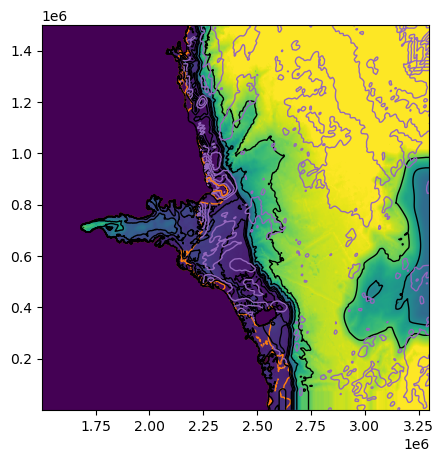

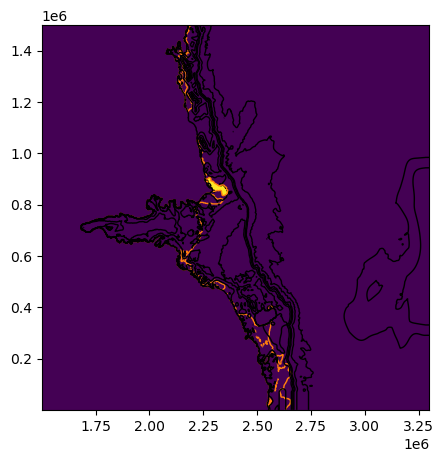

In [11]:

grd['hc']=ds_CTRL.hc
grd['s_w']=ds_CTRL.s_w
grd['s_rho']=ds_CTRL.s_rho
grd['Cs_w']=ds_CTRL.Cs_w
grd['Cs_r']=ds_CTRL.Cs_r



# make grid masks


grd['mask_zice'] = (grd.mask_rho.where(grd.zice<0)==1) # make a logic mask for ice
grd['mask_openocean'] = grd.mask_rho*(grd.mask_zice==0)
grd['mask_openoceanNaN'] = grd.mask_openocean.where(grd.mask_openocean)
grd['mask_rhoNaN'] = grd.mask_rho.where(grd.mask_rho)
grd['mask_ziceNaN'] = grd.mask_zice.where(grd.mask_zice)

# amery mask

poly_shelf = np.array([
    [1.55e6,600000],
    [2.25e6,600000],
    [2.25e6,800000],
    [2.20e6,830000],
    [1.55e6,890000]])

mask_roi = inpolygon(grd.x_rho.values, grd.y_rho.values,poly_shelf[:,0], poly_shelf[:,1])
grd['mask_zice_roi'] = grd.mask_zice*mask_roi
roi_label1 = 'amery'
grd.mask_zice_roi.attrs['long_name']=roi_label1

# polyna-center masks

ds_his = xr.open_dataset('/g/data/jk72/deg581/apom/frc/amery_v2km_tamura+era_swflux.nc')
swflux = ds_his["swflux"] 
ds_his.close()
del ds_his


plotting=False
if plotting==True:
    plt.figure(figsize=(5,5))
    plt.pcolormesh(ds_CTRL.h*ds_CTRL.mask_rho)
    plt.contour(ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)
    co2 = plt.contour(ds_CTRL.h*ds_CTRL.mask_rho,levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
    plt.contour(swflux.mean(dim='swf_time')*ds_CTRL.mask_openoceanNaN,levels=5,colors='C4',linestyles='-',linewidths=1)
    plt.plot(394,438,'x')
    plt.plot(364,393,'x')
    plt.plot(391,461,'x')
    plt.colorbar()
    plt.axis((300,500,250,500))

mask_burton_center = np.zeros_like(grd.lon_rho)
mask_burton_center[461:461+4,391:391+4]=1

mask_capedarnley_center = np.zeros_like(grd.lon_rho)
mask_capedarnley_center[437:437+4,393:393+4]=1

mask_mackenzie_center = np.zeros_like(grd.lon_rho)
mask_mackenzie_center[392:392+4,363:363+4]=1

mask_fasticetongue = np.zeros_like(grd.lon_rho)
mask_fasticetongue[400:425,367:425]=1
mask_fasticetongue = mask_fasticetongue*grd.mask_zice

if plotting==True:
    plt.figure(figsize=(5,5))
    plt.pcolormesh(mask_fasticetongue*ds_CTRL.zice,vmin=-10,vmax=0)
    plt.colorbar()
    plt.contour(ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)
    plt.axis((300,500,250,500))


# make polynya-area masks


mask_capedarnley_tempo = np.zeros_like(grd.lon_rho)
mask_capedarnley_tempo[410:460,380:450]=1

plt.figure(figsize=(5,5))
plt.pcolormesh(grd.x_rho,grd.y_rho,grd.h*grd.mask_rho)
plt.contour(grd.x_rho,grd.y_rho,grd.zice*grd.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)
co2 = plt.contour(grd.x_rho,grd.y_rho,grd.h*grd.mask_rho,levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
plt.contour(grd.x_rho,grd.y_rho,swflux.mean(dim='swf_time')*grd.mask_openoceanNaN,levels=5,colors='C4',linestyles='-',linewidths=1)

cs = plt.contour(grd.x_rho,grd.y_rho,swflux.mean(dim='swf_time')*grd.mask_openoceanNaN*mask_capedarnley_tempo,levels=[2.8e-7],colors='C1',linestyles='-',linewidths=1) # units of m/s

# paths = cs.get_paths()[0].to_polygons()
# plt.plot(paths[1][:,0],paths[1][:,1])
p = cs.collections[0].get_paths()[0]
v = p.vertices
x = v[:,0]
y = v[:,1]
mask_capedarnley_tempo2 = inpolygon(grd.x_rho.values, grd.y_rho.values, x, y)


plt.figure(figsize=(5,5))
plt.contour(grd.x_rho,grd.y_rho,grd.zice*grd.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)
co2 = plt.contour(grd.x_rho,grd.y_rho,grd.h*grd.mask_rho,levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
cs = plt.contour(grd.x_rho,grd.y_rho,swflux.mean(dim='swf_time')*grd.mask_openoceanNaN*mask_capedarnley_tempo,levels=[2.8e-7],colors='C1',linestyles='-',linewidths=1) # units of m/s

plt.pcolormesh(grd.x_rho,grd.y_rho,mask_capedarnley_tempo2*grd.mask_openocean)

mask_capedarnley = mask_capedarnley_tempo2*grd.mask_openocean
grd['mask_capedarnley'] = mask_capedarnley
# define weighting parameters

weights = (1/grd.pm)*(1/grd.pn)
weights.name = "weights"



In [12]:
# ds_CTRL = ds_CTRL.drop_vars(['u_rho_doy','v_rho_doy','temp_doy','u_rho','v_rho'])


In [13]:
%%time

# dump the big fields
ds_CTRL = ds_CTRL.drop_vars(['m','Tstar','Ustar','u','v','temp','salt','rho','zeta','Tb','my','u_rho','v_rho'])
print(ds_CTRL.nbytes/1e9,'G')
ds_CTRL.load()

25.553973352 G
CPU times: user 36min 27s, sys: 26min 56s, total: 1h 3min 23s
Wall time: 7min 31s


<xarray.Dataset> Size: 26GB
Dimensions:            (tracer: 2, boundary: 4, s_rho: 31, s_w: 32,
                        eta_rho: 750, xi_rho: 900, xi_u: 899, eta_v: 749,
                        ocean_time: 365, day: 365, dayofyear: 73)
Coordinates: (12/17)
  * s_rho              (s_rho) float64 248B -0.9839 -0.9516 ... -0.01613
  * s_w                (s_w) float64 256B -1.0 -0.9677 -0.9355 ... -0.03226 0.0
    x_rho              (eta_rho, xi_rho) float64 5MB 1.501e+06 ... 3.299e+06
    y_rho              (eta_rho, xi_rho) float64 5MB 1e+03 1e+03 ... 1.499e+06
    x_u                (eta_rho, xi_u) float64 5MB 1.502e+06 ... 3.298e+06
    y_u                (eta_rho, xi_u) float64 5MB 1e+03 1e+03 ... 1.499e+06
    ...                 ...
    lon_rho            (eta_rho, xi_rho) float64 5MB 89.96 89.96 ... 65.55 65.56
    lat_rho            (eta_rho, xi_rho) float64 5MB -76.25 -76.23 ... -57.51
    z_w0               (s_w, eta_rho, xi_rho) float64 173MB 0.0 0.0 ... 0.0 0.0
    z_rho0             (s_rho, eta_rho, xi_rho) float64 167MB 0.0 0.0 ... -3.873
  * day                (day) int64 3kB 356 361 1 6 11 16 ... 331 336 341 346 351
  * dayofyear          (dayofyear) int64 584B 1 6 11 16 21 ... 346 351 356 361
Dimensions without coordinates: tracer, boundary, eta_rho, xi_rho, xi_u, eta_v
Data variables: (12/97)
    ntimes             int32 4B 131400
    ndtfast            int32 4B 40
    dt                 float64 8B 240.0
    dtfast             float64 8B 6.0
    dstart             datetime64[ns] 8B 2007-01-01
    nHIS               int32 4B 1800
    ...                 ...
    dA                 (eta_rho, xi_rho) float64 5MB 4.073e+06 ... 3.574e+06
    salt_doy           (dayofyear, s_rho, eta_rho, xi_rho) float32 6GB nan .....
    temp_doy           (dayofyear, s_rho, eta_rho, xi_rho) float32 6GB nan .....
    my_doy             (dayofyear, eta_rho, xi_rho) float64 394MB nan ... 0.0
    u_rho_doy          (dayofyear, s_rho, eta_rho, xi_rho) float32 6GB nan .....
    v_rho_doy          (dayofyear, s_rho, eta_rho, xi_rho) float32 6GB nan .....
Attributes: (12/35)
    file:              /g/data/gv90/bkg581/prd_amery/amery_CTRL/roms_avg_0049.nc
    format:            netCDF-3 64bit offset file
    Conventions:       CF-1.4, SGRID-0.3
    type:              ROMS/TOMS nonlinear model averages file
    title:             Amery Ice Shelf-ocean Application
    var_info:          ROMS/External/varinfo.yaml
    ...                ...
    compiler_command:  /apps/openmpi/4.0.2/bin/mpif90
    compiler_flags:    -fp-model precise -heap-arrays -ip -O3 -traceback -che...
    tiling:            020x024
    history:           ROMS/TOMS, Version 4.1, Wednesday - October 2, 2024 - ...
    ana_file:          ROMS/Functionals/ana_btflux.h, ROMS/Functionals/ana_sr...
    CPP_options:       AMERY, ADD_FSOBC, ANA_BSFLUX, ANA_BTFLUX, ANA_INITIAL,...

In [14]:
# define time periods
winter_period=slice(51,64)
summer_period=slice(14,27)

print(ds_CTRL.dayofyear.isel(dayofyear=winter_period)[0].values,' to ',ds_CTRL.dayofyear.isel(dayofyear=winter_period)[-1].values)
print(ds_CTRL.dayofyear.isel(dayofyear=summer_period)[0].values,' to ',ds_CTRL.dayofyear.isel(dayofyear=summer_period)[-1].values)

winter_period_doy=slice(49,62)
summer_period_doy=slice(12,25)

print(ds_CTRL.dayofyear.isel(dayofyear=winter_period_doy)[0].values,' to ',ds_CTRL.dayofyear.isel(dayofyear=winter_period_doy)[-1].values)
print(ds_CTRL.dayofyear.isel(dayofyear=summer_period_doy)[0].values,' to ',ds_CTRL.dayofyear.isel(dayofyear=summer_period_doy)[-1].values)


late_summer_period=slice(20,80)
early_seaice_period=slice(80,130)
seaice_period=slice(130,330)
early_summer_period1=slice(330,366)
early_summer_period2=slice(0,20)


256  to  316
71  to  131
246  to  306
61  to  121


### load any other data sets

In [15]:
# now load lima

import rioxarray

lima_full = rioxarray.open_rasterio('../data/raw/lima/00000-20080319-092059124.tif')

lima = lima_full.where((lima_full.x>1.68e6)&(lima_full.x<2.5e6)&(lima_full.y>.4e6)&(lima_full.y<1e6),drop=True)


In [16]:
from matplotlib.colors import TwoSlopeNorm
import matplotlib.cm as cm

### make 4 circulation plots - split into sea ice seasons

In [19]:
res=5

Text(0.5, 0.98, 'Bottom temperature and velocities')

<Figure size 640x480 with 0 Axes>

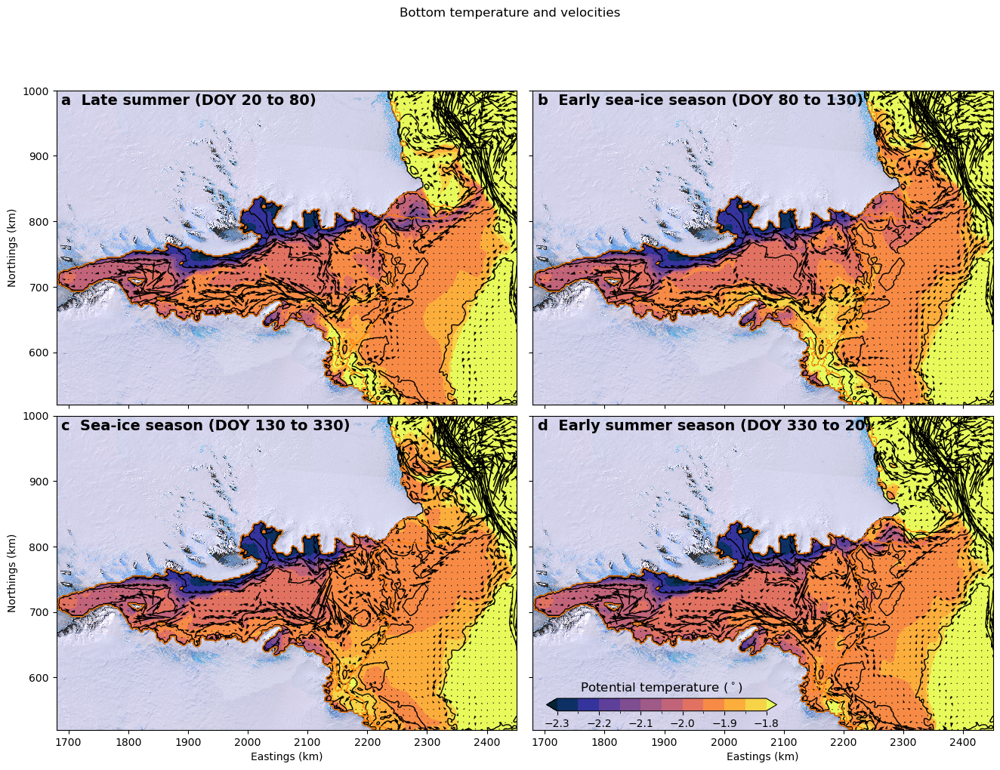

In [28]:


us_rho_s1   = ds_CTRL.u_rho_doy.sel(dayofyear=late_summer_period).mean(dim='dayofyear')   
vs_rho_s1   = ds_CTRL.v_rho_doy.sel(dayofyear=late_summer_period).mean(dim='dayofyear')   
us_rho_s2   = ds_CTRL.u_rho_doy.sel(dayofyear=early_seaice_period).mean(dim='dayofyear')   
vs_rho_s2   = ds_CTRL.v_rho_doy.sel(dayofyear=early_seaice_period).mean(dim='dayofyear')   
us_rho_s3   = ds_CTRL.u_rho_doy.sel(dayofyear=seaice_period).mean(dim='dayofyear')   
vs_rho_s3   = ds_CTRL.v_rho_doy.sel(dayofyear=seaice_period).mean(dim='dayofyear')   
us_rho_s4   = (xr.concat( [ds_CTRL.u_rho_doy.sel(dayofyear=early_summer_period1),ds_CTRL.u_rho_doy.sel(dayofyear=early_summer_period2)],dim='dayofyear')).mean(dim='dayofyear')
vs_rho_s4   = (xr.concat( [ds_CTRL.v_rho_doy.sel(dayofyear=early_summer_period1),ds_CTRL.v_rho_doy.sel(dayofyear=early_summer_period2)],dim='dayofyear')).mean(dim='dayofyear')



plt.cla()
plt.clf()
fig = plt.figure(figsize=[16,11])
ax = None

gs = gridspec.GridSpec(nrows=2,ncols=2,wspace=0.035, hspace=0.035)

choose_depth=0

ax=fig.add_subplot(gs[0,0])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=late_summer_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2.3,-1.75,.05),add_colorbar=False)
# im = ds_CTRL.temp.isel(s_rho=-2).isel(ocean_time=slice(270,330)).mean(dim='ocean_time').plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.cmo.thermal',add_colorbar=False,vmin=-2.5,vmax=.5,levels=12)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s1.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s1.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)


co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_xlabel('')
ax.set_xticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'a  Late summer (DOY 20 to 80)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[0,1])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=early_seaice_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2.3,-1.75,.05),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s2.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s2.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
ax.set_xlabel('')
ax.set_xticklabels([])
ax.set_ylabel('')
ax.set_yticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'b  Early sea-ice season (DOY 80 to 130)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[1,0])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=seaice_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2.3,-1.75,.05),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s3.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s3.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'c  Sea-ice season (DOY 130 to 330)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[1,1])
(lima.astype('uint8')).plot.imshow()
im2 = (( xr.concat( [ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=early_summer_period1),ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=early_summer_period2)],dim='dayofyear') )
                                                                                    .mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2.3,-1.75,.05),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s4.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s4.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))

ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_ylabel('')
ax.set_yticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'd  Early summer season (DOY 330 to 20)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')


cax = inset_axes(ax,
                width="50%",  # width = 10% of parent_bbox width
                height="4%",  # height : 50%
                loc='lower left',
                bbox_to_anchor=(.03,0.06, 1, 1),
                bbox_transform=ax.transAxes,
                borderpad=0,
                )
cbar = fig.colorbar(im2, cax=cax, orientation='horizontal') 
cax.set_title(r'Potential temperature ($^\circ$C)')#,fontsize=14)


fig.suptitle('Bottom temperature and velocities')

Text(0.5, 0.98, 'Surface temperature and velocities')

<Figure size 640x480 with 0 Axes>

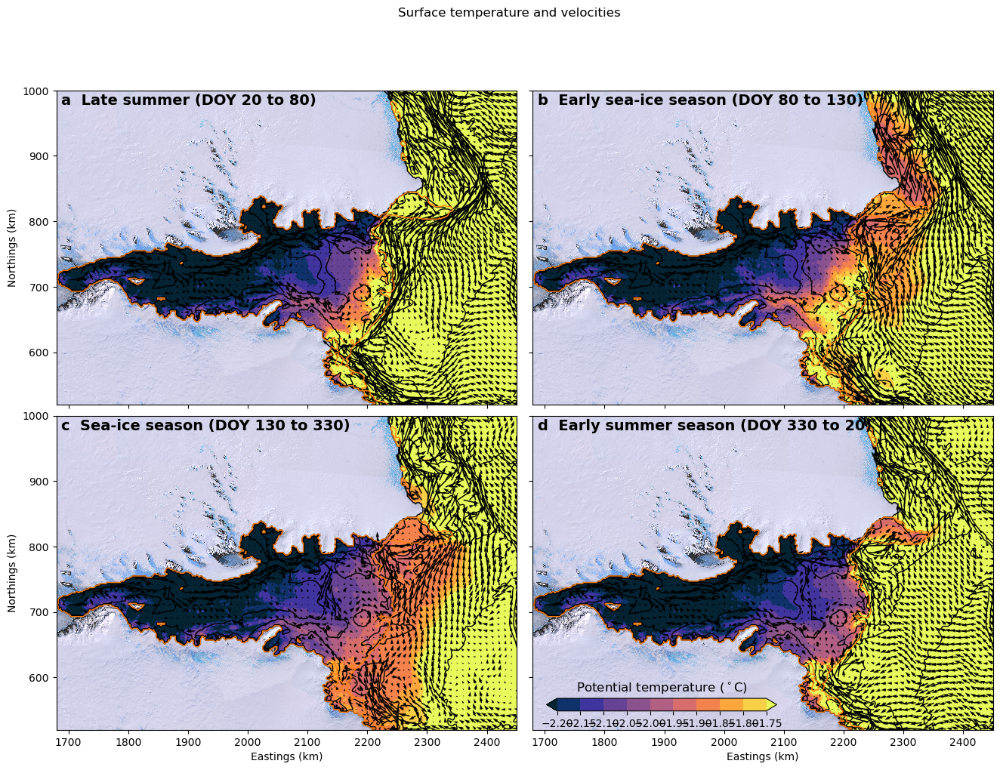

In [37]:





plt.cla()
plt.clf()
fig = plt.figure(figsize=[16,11])
ax = None

gs = gridspec.GridSpec(nrows=2,ncols=2,wspace=0.035, hspace=0.035)

choose_depth=-1

ax=fig.add_subplot(gs[0,0])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=late_summer_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2.2,-1.75,.05),add_colorbar=False)
# im = ds_CTRL.temp.isel(s_rho=-2).isel(ocean_time=slice(270,330)).mean(dim='ocean_time').plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.cmo.thermal',add_colorbar=False,vmin=-2.5,vmax=.5,levels=12)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s1.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s1.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)


co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_xlabel('')
ax.set_xticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'a  Late summer (DOY 20 to 80)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[0,1])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=early_seaice_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2.2,-1.75,.05),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s2.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s2.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
ax.set_xlabel('')
ax.set_xticklabels([])
ax.set_ylabel('')
ax.set_yticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'b  Early sea-ice season (DOY 80 to 130)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[1,0])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=seaice_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2.2,-1.75,.05),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s3.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s3.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'c  Sea-ice season (DOY 130 to 330)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[1,1])
(lima.astype('uint8')).plot.imshow()
im2 = (( xr.concat( [ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=early_summer_period1),ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=early_summer_period2)],dim='dayofyear') )
                                                                                    .mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2.2,-1.75,.05),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s4.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s4.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))

ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_ylabel('')
ax.set_yticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'd  Early summer season (DOY 330 to 20)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')

cax = inset_axes(ax,
                width="50%",  # width = 10% of parent_bbox width
                height="4%",  # height : 50%
                loc='lower left',
                bbox_to_anchor=(.03,0.06, 1, 1),
                bbox_transform=ax.transAxes,
                borderpad=0,
                )
cbar = fig.colorbar(im2, cax=cax, orientation='horizontal') 
cax.set_title(r'Potential temperature ($^\circ$C)')#,fontsize=14)

fig.suptitle('Surface temperature and velocities')

Text(0.5, 0.98, 'Mid-column temperature and velocities')

<Figure size 640x480 with 0 Axes>

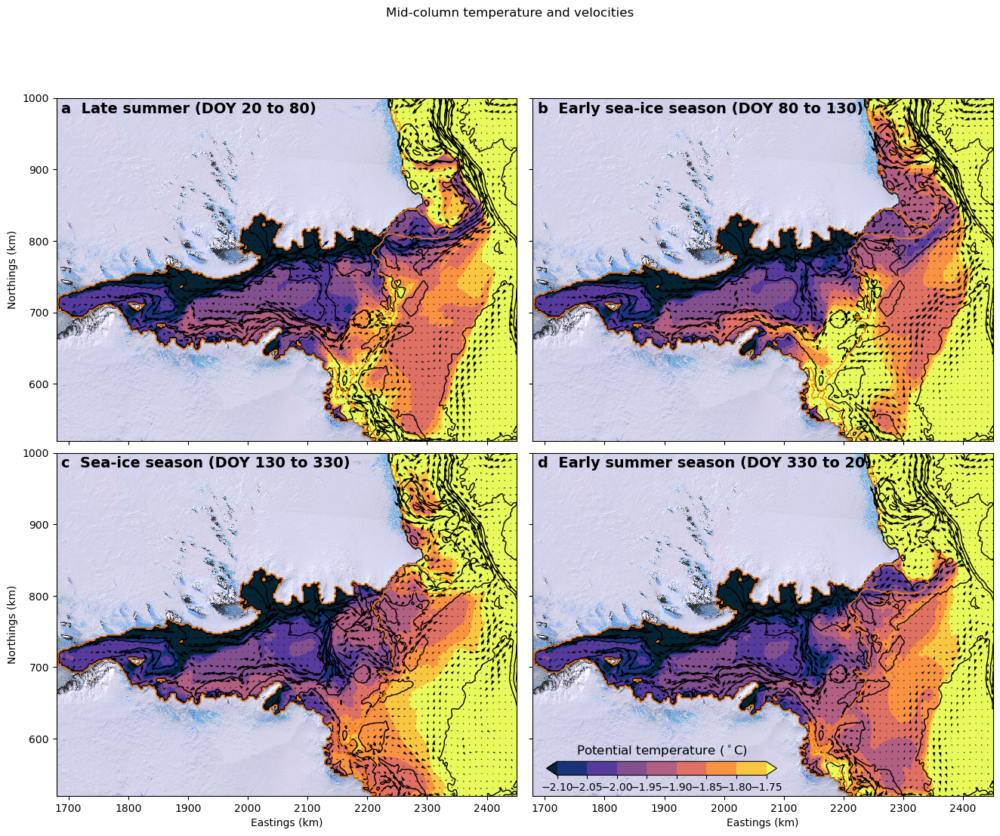

In [36]:





plt.cla()
plt.clf()
fig = plt.figure(figsize=[16,12])
ax = None

gs = gridspec.GridSpec(nrows=2,ncols=2,wspace=0.035, hspace=0.035)

choose_depth=15

ax=fig.add_subplot(gs[0,0])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=late_summer_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2.1,-1.75,.05),add_colorbar=False)
# im = ds_CTRL.temp.isel(s_rho=-2).isel(ocean_time=slice(270,330)).mean(dim='ocean_time').plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.cmo.thermal',add_colorbar=False,vmin=-2.5,vmax=.5,levels=12)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s1.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s1.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)


co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_xlabel('')
ax.set_xticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'a  Late summer (DOY 20 to 80)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[0,1])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=early_seaice_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2.1,-1.75,.05),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s2.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s2.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
ax.set_xlabel('')
ax.set_xticklabels([])
ax.set_ylabel('')
ax.set_yticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'b  Early sea-ice season (DOY 80 to 130)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[1,0])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=seaice_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2.1,-1.75,.05),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s3.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s3.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'c  Sea-ice season (DOY 130 to 330)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[1,1])
(lima.astype('uint8')).plot.imshow()
im2 = (( xr.concat( [ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=early_summer_period1),ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=early_summer_period2)],dim='dayofyear') )
                                                                                    .mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2.1,-1.75,.05),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s4.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s4.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))

ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_ylabel('')
ax.set_yticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'd  Early summer season (DOY 330 to 20)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')

cax = inset_axes(ax,
                width="50%",  # width = 10% of parent_bbox width
                height="4%",  # height : 50%
                loc='lower left',
                bbox_to_anchor=(.03,0.06, 1, 1),
                bbox_transform=ax.transAxes,
                borderpad=0,
                )
cbar = fig.colorbar(im2, cax=cax, orientation='horizontal') 
cax.set_title(r'Potential temperature ($^\circ$C)')#,fontsize=14)

fig.suptitle('Mid-column temperature and velocities')

Now split into rough seasons: DJF, MAM, JJA, SON

Text(0.5, 0.98, 'Bottom temperature and velocities')

<Figure size 640x480 with 0 Axes>

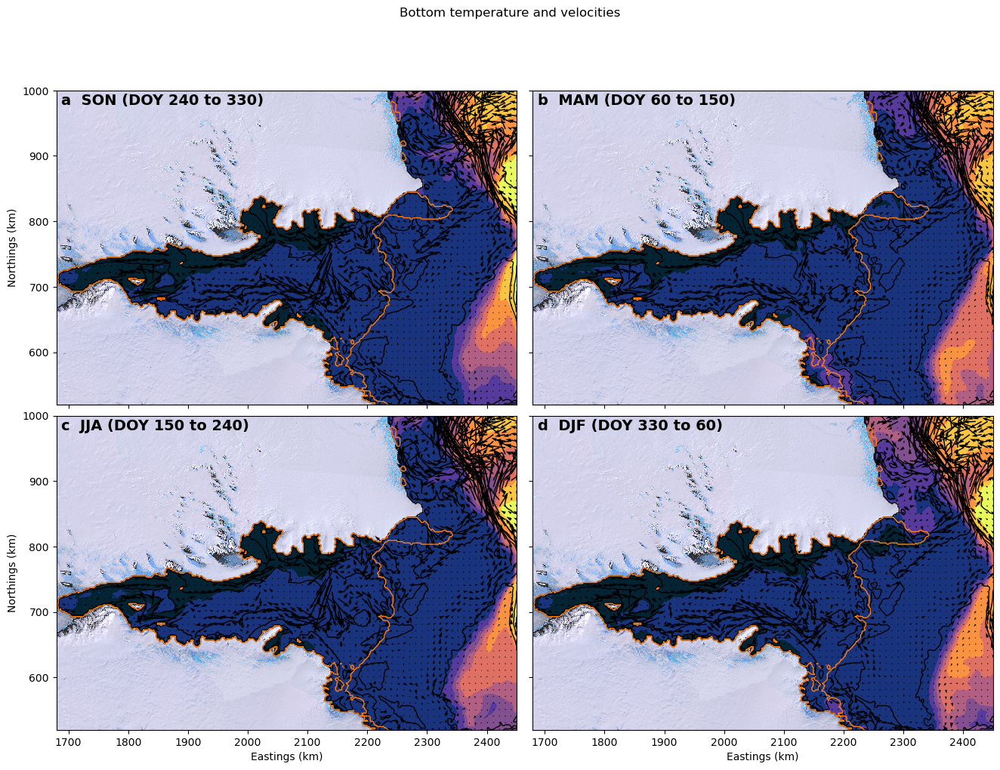

In [31]:

mam_period=slice(60,150)
jja_period=slice(150,240)
son_period=slice(240,330)
djf_period1=slice(330,366)
djf_period2=slice(0,60)


us_rho_s4   = (xr.concat( [ds_CTRL.u_rho_doy.sel(dayofyear=djf_period1),ds_CTRL.u_rho_doy.sel(dayofyear=djf_period2)],dim='dayofyear')).mean(dim='dayofyear')
vs_rho_s4   = (xr.concat( [ds_CTRL.v_rho_doy.sel(dayofyear=djf_period1),ds_CTRL.v_rho_doy.sel(dayofyear=djf_period2)],dim='dayofyear')).mean(dim='dayofyear')
us_rho_s2   = ds_CTRL.u_rho_doy.sel(dayofyear=mam_period).mean(dim='dayofyear')   
vs_rho_s2   = ds_CTRL.v_rho_doy.sel(dayofyear=mam_period).mean(dim='dayofyear')   
us_rho_s3   = ds_CTRL.u_rho_doy.sel(dayofyear=jja_period).mean(dim='dayofyear')   
vs_rho_s3   = ds_CTRL.v_rho_doy.sel(dayofyear=jja_period).mean(dim='dayofyear')   
us_rho_s1   = ds_CTRL.u_rho_doy.sel(dayofyear=son_period).mean(dim='dayofyear')   
vs_rho_s1   = ds_CTRL.v_rho_doy.sel(dayofyear=son_period).mean(dim='dayofyear')   



plt.cla()
plt.clf()
fig = plt.figure(figsize=[16,11])
ax = None

gs = gridspec.GridSpec(nrows=2,ncols=2,wspace=0.035, hspace=0.035)

choose_depth=0

ax=fig.add_subplot(gs[0,0])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=son_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2,0,.25),add_colorbar=False)
# im = ds_CTRL.temp.isel(s_rho=-2).isel(ocean_time=slice(270,330)).mean(dim='ocean_time').plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.cmo.thermal',add_colorbar=False,vmin=-2.5,vmax=.5,levels=12)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s1.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s1.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)


co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_xlabel('')
ax.set_xticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'a  SON (DOY 240 to 330)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[0,1])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=mam_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2,0,.25),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s2.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s2.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
ax.set_xlabel('')
ax.set_xticklabels([])
ax.set_ylabel('')
ax.set_yticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'b  MAM (DOY 60 to 150)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[1,0])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=jja_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2,0,.25),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s3.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s3.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'c  JJA (DOY 150 to 240)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[1,1])
(lima.astype('uint8')).plot.imshow()
im2 = (( xr.concat( [ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=djf_period1),ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=djf_period2)],dim='dayofyear') )
                                                                                    .mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2,0,.25),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s4.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s4.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))

ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_ylabel('')
ax.set_yticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'd  DJF (DOY 330 to 60)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')


cax = inset_axes(ax,
                width="50%",  # width = 10% of parent_bbox width
                height="4%",  # height : 50%
                loc='lower left',
                bbox_to_anchor=(.03,0.06, 1, 1),
                bbox_transform=ax.transAxes,
                borderpad=0,
                )
cbar = fig.colorbar(im2, cax=cax, orientation='horizontal') 
cax.set_title(r'Potential temperature ($^\circ$C)')#,fontsize=14)
fig.suptitle('Bottom temperature and velocities')

Try hydrological seasons as well - JFM, AMJ, JAS, OND

Text(0.5, 0.98, 'Bottom temperature and velocities')

<Figure size 640x480 with 0 Axes>

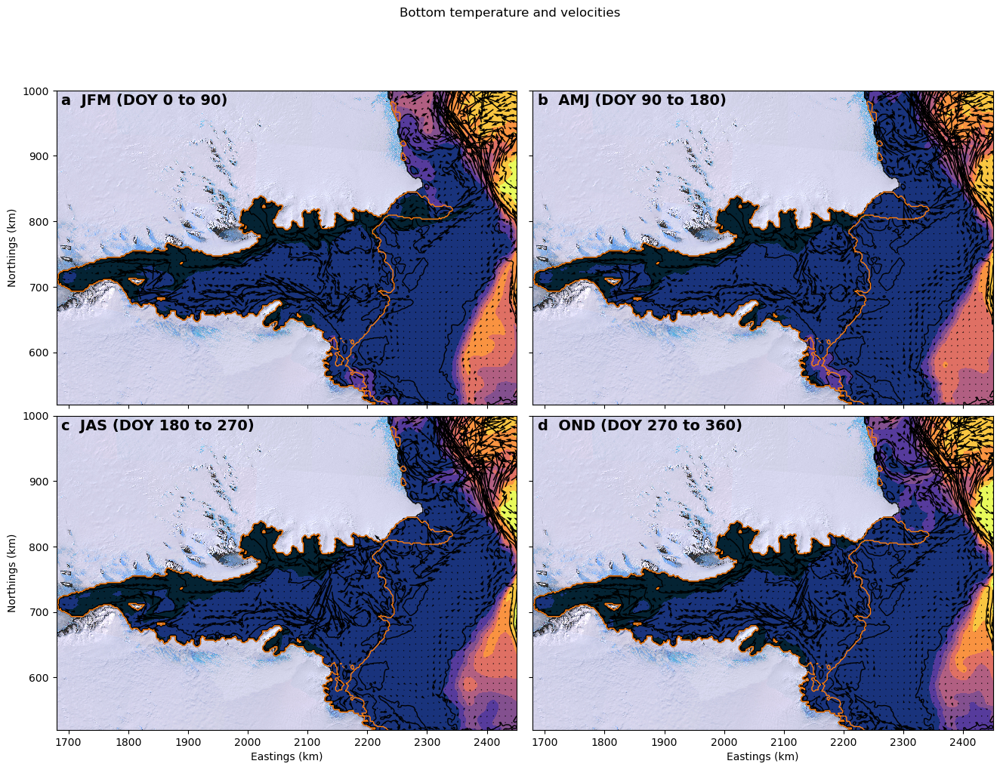

In [32]:

jfm_period=slice(0,90)
amj_period=slice(90,180)
jas_period=slice(180,270)
ond_period=slice(270,366)




us_rho_s1   = ds_CTRL.u_rho_doy.sel(dayofyear=jfm_period).mean(dim='dayofyear')   
vs_rho_s1   = ds_CTRL.v_rho_doy.sel(dayofyear=jfm_period).mean(dim='dayofyear')  
us_rho_s2   = ds_CTRL.u_rho_doy.sel(dayofyear=amj_period).mean(dim='dayofyear')   
vs_rho_s2   = ds_CTRL.v_rho_doy.sel(dayofyear=amj_period).mean(dim='dayofyear')   
us_rho_s3   = ds_CTRL.u_rho_doy.sel(dayofyear=jas_period).mean(dim='dayofyear')   
vs_rho_s3   = ds_CTRL.v_rho_doy.sel(dayofyear=jas_period).mean(dim='dayofyear')    
us_rho_s4   = ds_CTRL.u_rho_doy.sel(dayofyear=ond_period).mean(dim='dayofyear')   
vs_rho_s4   = ds_CTRL.v_rho_doy.sel(dayofyear=ond_period).mean(dim='dayofyear')


plt.cla()
plt.clf()
fig = plt.figure(figsize=[16,11])
ax = None

gs = gridspec.GridSpec(nrows=2,ncols=2,wspace=0.035, hspace=0.035)

choose_depth=0

ax=fig.add_subplot(gs[0,0])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=jfm_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2,0,.25),add_colorbar=False)
# im = ds_CTRL.temp.isel(s_rho=-2).isel(ocean_time=slice(270,330)).mean(dim='ocean_time').plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.cmo.thermal',add_colorbar=False,vmin=-2.5,vmax=.5,levels=12)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s1.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s1.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)


co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_xlabel('')
ax.set_xticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'a  JFM (DOY 0 to 90)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[0,1])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=amj_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2,0,.25),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s2.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s2.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
ax.set_xlabel('')
ax.set_xticklabels([])
ax.set_ylabel('')
ax.set_yticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'b  AMJ (DOY 90 to 180)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[1,0])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=jas_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2,0,.25),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s3.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s3.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))
ax.set_ylabel('Northings (km)')
ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'c  JAS (DOY 180 to 270)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')



##########

ax=fig.add_subplot(gs[1,1])
(lima.astype('uint8')).plot.imshow()
im2 = (ds_CTRL.mask_rho*(ds_CTRL.mask_rhoNaN)*ds_CTRL.temp_doy.isel(s_rho=choose_depth).sel(dayofyear=ond_period).mean(dim='dayofyear')).plot.contourf(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',
                                                                                                                      levels=np.arange(-2,0,.25),add_colorbar=False)
ax.quiver(grd.x_rho.values[0::res,0::res], grd.y_rho.values[0::res,0::res], us_rho_s4.isel(s_rho=choose_depth).values[0::res,0::res], vs_rho_s4.isel(s_rho=choose_depth).values[0::res,0::res],scale=2.5)

co2 = (ds_CTRL.h*ds_CTRL.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=(0,250,500,750,1000,2000,3000),colors='k',linestyles='-',linewidths=1)
co3 = ax.contour(ds_CTRL.x_rho,ds_CTRL.y_rho,ds_CTRL.zice*ds_CTRL.mask_rho,levels=(-1,0),colors='C1',linestyles='-',linewidths=1)

ax.set_xlim((1.68e6,2.45e6))
ax.set_ylim((.52e6,1.0e6))

ax.set_xlabel('Eastings (km)')
# ax.grid()
scale_ticks = 1e3
ticks_x = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = mticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_ticks))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_xticklabels([])
ax.set_ylabel('')
ax.set_yticklabels([])
ax.set_title('')
ax.text(0.01, 0.99, 'd  OND (DOY 270 to 360)', transform=ax.transAxes,fontsize=14, fontweight='bold', va='top')


cax = inset_axes(ax,
                width="50%",  # width = 10% of parent_bbox width
                height="4%",  # height : 50%
                loc='lower left',
                bbox_to_anchor=(.03,0.06, 1, 1),
                bbox_transform=ax.transAxes,
                borderpad=0,
                )
cbar = fig.colorbar(im2, cax=cax, orientation='horizontal') 
cax.set_title(r'Potential temperature ($^\circ$C)')#,fontsize=14)
fig.suptitle('Bottom temperature and velocities')